# 2019-02-05 - RF Mapping
Méthode de : http://www.jneurosci.org/content/26/12/3269

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import datetime
import os
import imageio

In [2]:
def homemade_kronecker(arr, n):
    '''
    Homemade kronecker product of two arrays, used here to upscale the simulus
    It's 12 µs faster than numpy's, which is significant given how many kron product
    we'll have to do
    '''
    
    kr = np.repeat(arr, n* np.ones(arr.shape[0], np.int), axis = 0)
    kr = np.repeat(kr, n* np.ones(arr.shape[0], np.int), axis = 1)
    
    return kr

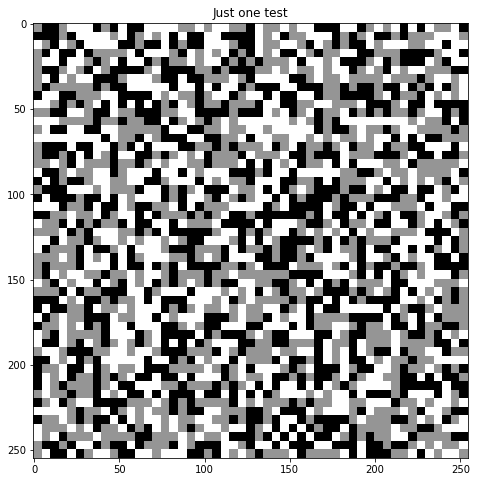

In [3]:
np.random.seed(42)

Z = np.random.random((51,51))

# G is a NxNx3 matrix
G = np.zeros((51,51))

# Where we set the RGB for each pixel
G[Z>0.66] = 1
G[Z<0.33] = 0
G[np.bitwise_and(Z>0.33, Z<0.66)] = .5

plt.figure(figsize = (12,8))
plt.imshow(homemade_kronecker(G, 5), cmap = 'Greys')
plt.title('Just one test')
plt.show()

In the paper, they change the pattern every 2 frame (26 ms) and do a total of 68k frames, which is roughly 30 mn of stim

In [4]:
now = datetime.datetime.now()
strtime = now.strftime("%Y-%m-%d_%H:%M:%S")   

figpath = os.path.join('sequences/RFMap_%s'% strtime)
if not(os.path.isdir(figpath)): os.mkdir(figpath)

In [5]:
figpath

'sequences/RFMap_2019-02-06_08:45:38'

In [6]:
rng = np.random.RandomState(42)

refresh_rate = 60 #Hz
duration = 1800 #s, half an hour is used in the paper

itr = 0
N_frame_total = refresh_rate * duration


while itr < N_frame_total:
    itr +=1
    
    if itr%2 == 0 :
        Z = np.random.random((51,51))
        G = np.zeros((51,51,1))

        G[Z>0.66] = 1
        G[Z<0.33] = 0
        G[np.bitwise_and(Z>0.33, Z<0.66)] = .5
    
    imageio.imwrite(figpath+'/%s.png' % itr, homemade_kronecker(G, 5))
    
os.remove(figpath+'/1.png')

# Analysis to be added here